## Universidade Cruzeiro do Sul


## Processamento de Imagens - Prof. Flavio Lima de Oliveira

### 1º Semestre de 2024
<br></br>

# Relatório do Projeto

## Grupo

* Nome: Giovana Gomes de Lima 
* Nome: Camilly Castelo de Carvalho 
* Nome: Alfonso Romeral Correa 
* Nome: Leonardo Bonanno de Brito 
* Nome: Anna Beatriz Carvalho Nonato 

---
#Trabalho Processamento de Imagens - Reconhecimento de Placas
---

<font color="red"></font>

## Resumo

O projeto visa desenvolver um programa para melhorar a qualidade de imagens de placas de veículos danificadas, desgastadas ou enferrujadas, com o objetivo de otimizar seu reconhecimento. Utilizando diversas técnicas de processamento de imagem, como equalização, filtros de desfoque, limiarização, erosão e dilatação, busca-se aprimorar a detecção de letras e números nas placas, visando uma maior precisão no reconhecimento. O estudo enfrentou desafios relacionados à falta de contraste adequado entre as cores, presença de ferrugem e danos nas placas, dificultando a distinção entre o fundo e as letras. Apesar disso, alguns bons resultados foram obtidos em algumas imagens, utilizando métodos de filtragem espacial e morfologia matemática. No entanto, nem todas as imagens tiveram sucesso com o método, sendo necessário implementar novos filtros e aprimoramentos para melhorar o reconhecimento em diferentes veículos simultaneamente. Para avanços futuros, planeja-se explorar métodos avançados de processamento de imagens, visão computacional e inteligência artificial, buscando melhorar a qualidade de imagens de baixa resolução e a precisão do reconhecimento de placas. O objetivo final é garantir que o sistema de processamento de imagens seja eficaz em lidar com os desafios na segurança e monitoramento de tráfego.











## Introdução


Com foco específico na identificação de placas de veículos, foram selecionadas quatro imagens principais, criteriosamente escolhidas pela qualidade e clareza, e submetidas a diversos filtros de processamento de imagem. Entre os filtros aplicados estão Equalização, Abertura, Median, Gaussian Blur, filtro black hat, filtro top hat, erosão e dilatação. Essas técnicas visam aprimorar a detecção de letras e números nas placas, contribuindo para uma maior precisão no reconhecimento das mesmas.

## Objetivo



O presente trabalho visa o desenvolvimento de um programa destinado a aprimorar a qualidade de imagens de placas de veículos danificadas, desgastadas ou enferrujadas, visando otimizar o seu reconhecimento. A proposta é que, em um futuro próximo, tais placas sejam detectadas por um sistema de inteligência artificial, que realizará a identificação e fornecerá os dados pertinentes da placa. Este projeto busca contribuir para a melhoria dos sistemas de reconhecimento de placas veiculares, promovendo maior eficácia e precisão na identificação dos veículos.

## Desenvolvimento


#### Parte 1 - Importando os dados

!pip install opencv-python: O pip baixará o pacote OpenCV-Python e todas as suas dependências necessárias e as instalará em seu ambiente Python local. Permitindo usar as funcionalidades do OpenCV para a utilização das funções de detecção de objetos, manipulação de imagens, manipulação de vídeos, detecção de rostos entre outros.

!pip install easyocr: O pip baixará o pacote EasyOCR e todas as suas dependências necessárias e as instalará em seu ambiente Python local. Permitindo usar as funcionalidades do EasyOCR para reconhecer texto em imagens.

import cv2: Utilizado neste código para realizar operações de desenho (como desenhar retângulos) e adição de texto em uma imagem, destacando a visualização das informações identificadas por algoritmos de detecção de objetos ou de processamento de imagens.

from google.colab.patches import cv2_imshow: Serve para permitir a exibição de imagens no notebook do Google Colab utilizando a função cv2_imshow, que é uma adaptação da função cv2.imshow do OpenCV para funcionar corretamente neste ambiente específico, o cv2.imshow é utilizado para exibir as imagens.

import matplotlib.pylab as plt: Utilizado para criar visualizações gráficas, como gráficos de linhas, histogramas, dispersões, entre outros, utilizando a biblioteca matplotlib.

import easyocr: Acessa às funcionalidades da biblioteca EasyOCR, dando a capacidade de realizar tarefas de detecção de texto nas imagens.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!pip install opencv-python
!pip install easyocr

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pylab as plt
import easyocr

# Descrição das Imagens
Todas as imagens das placas utilizadas no desenvolvimento deste projeto foram obtidas por meio de pesquisas realizadas no Google, tanto em Inglês quanto em Português. Sendo assim, com esse método de pesquisa, algumas das placas representadas não são exclusivamente do Brasil.

As placas escolhidas apresentam má qualidade, estando enferrujadas, com pintura ruim ou ilegíveis.







#Descrição do Método Utilizado

Este estudo apresenta um método para reconhecimento de placas em imagens, abordando etapas como pré-processamento, realce de regiões escuras, limiarização, refinamento morfológico, reconhecimento de texto e marcação dos resultados. Abaixo há o passo a passo realizado no projeto.

Carregar a Imagem > Conversão para Escala de Cinza > Equalização do Histograma > Aplicação de Desfoque (Blur ou Median Blur) > Aplicação do Filtro Black Hat ou Top Hat > Limiarização > Erosão e Dilatação > Reconhecimento de Texto com EasyOCR > Marcação de Texto (desenhos ao redor das áreas de texto detectadas) > Exibição do Resultado.

Espera-se que essa abordagem contribua para o desenvolvimento de sistemas mais inteligentes e eficientes para monitoramento e segurança viária.

#Descrição das ferramentas utilizadas (código, funções, bibliotecas, repositórios...)


Este código utiliza algumas ferramentas poderosas para realizar a detecção e leitura de texto em uma imagem de carro:

###Reconhecimento

* Após converter a imagem para a escala de cinza, utilizamos o EasyOCR, realizando assim a detecção e leitura da placa. Em reader é especificando o idioma, em seguida, a função readtext é chamada passando a imagem em escala de cinza como argumento. O resultado da detecção é armazenado na variável result. Após o armazenamento, é criado um loop que percorre cada detecção de texto em result, obtendo as coordenadas e o texto da detecção, desenhado um retângulo em volta da placa e adicionando a numeração à imagem original img. Por fim exibe a imagem original img, agora com a identificação.

###Escala de cinza:
* Lê a imagem pelo seu caminho e aplica a uma variável.

* cv2.cvtColor() Converte a imagem de colorida para tons de cinza e armazena o resultado na variável

###Equalização
* Este código equaliza o histograma de uma imagem em tons de cinza usando o método CLAHE (Contrast Limited Adaptive Histogram Equalization), o que pode melhorar o contraste e a qualidade da imagem, especialmente em áreas com variações de iluminação.

* cv2.createCLAHE() é usado para criar um objeto de equalização de histograma com determinados parâmetros.

###Gaussian Blur
* GaussianBlur é uma técnica usada para suavizar uma imagem, reduzindo ruído e eliminando detalhes pequenos, enquanto preserva as bordas significativas na imagem.

###TopHat e BlackHat
* TOPHAT e BLACKHAT são transformações morfológicas em processamento de imagens. A transformação TOPHAT é a diferença entre a imagem original e sua abertura, enquanto a transformação BLACKHAT é a diferença entre a imagem original e seu fechamento. Essas transformações são úteis para identificar e extrair detalhes específicos da imagem, como detalhes claros sobre um fundo escuro (cv2.MORPH_TOPHAT) ou detalhes escuros sobre um fundo claro (cv2.MORPH_BLACKHAT).

* No código, np.ones((A, B),np.uint8) é um kernel (ou elemento estruturante) usado na operação morfológica BLACKHAT. Ele é uma matriz de dimensões AxB preenchida com valores 1 (um) e do tipo uint8 (inteiro sem sinal de 8 bits).

###Limiarização
* Consiste em classificar os pixels de uma imagem em duas categorias: branco ou preto, com base em um valor de limiar especificado.  

Cv2.threshold(): recebe quatro parâmetros: a imagem de entrada, o valor de limiarm, o valor máximo e a constante THRESH_BINARY.  

###Erosão
* Erosão é uma operação que "Erode" ou diminui as fronteiras dos objetos, tornando essas regiões menores. Ou seja, ela remove pixels na borda dos objetos.

###Dilatação

* Dilatação é uma operação que expande ou aumenta as fronteiras dos objetos, tornando essas regiões maiores. Ou seja, ela adiciona pixels à borda dos objetos.

###Abertura

* O código de operação de abertura morfológica pode ajudar a remover pequenos detalhes indesejados, como ruído, enquanto preserva as características principais da imagem.

###Histograma

* Os histogramas fornecem uma visualização da distribuição dos níveis de intensidade de pixel em cada etapa do processo de pré-processamento da imagem, ajudando a entender como as transformações afetam a distribuição de intensidades. Isso é crucial para ajustar os parâmetros e garantir que os caracteres da placa sejam extraídos de forma eficaz.











#Código

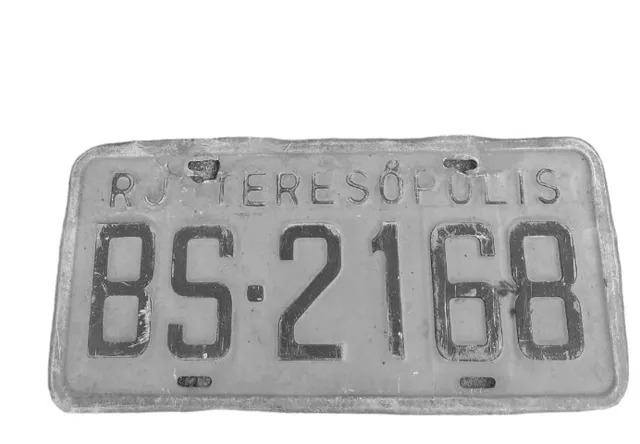

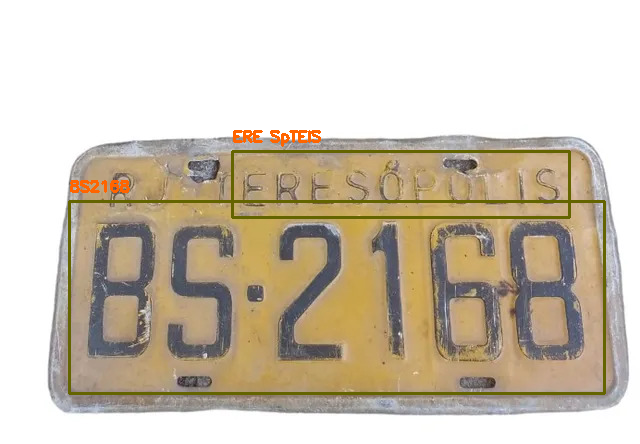

In [ ]:
#### VAI UTILIZAR APENAS PARA EXPLICAR O CÓDIGO DE RECONHECIMENTO


img = cv2.imread('/content/drive/MyDrive/ImagensTrabalhoPlaca/Carros/carro15.jpeg')

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

# Detectar e ler texto usando EasyOCR
reader = easyocr.Reader(['en'])
result = reader.readtext(gray)

for detection in result:
    # Obter coordenadas e texto da detecção
    top_left = tuple(map(int, detection[0][0]))
    bottom_right = tuple(map(int, detection[0][2]))
    text = detection[1]

    # Desenhar retângulo e texto na imagem original
    cv2.rectangle(img, top_left, bottom_right, (0, 100, 100), 2)
    cv2.putText(img, text, (top_left[0], top_left[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 100, 255), 2)

cv2_imshow(img)

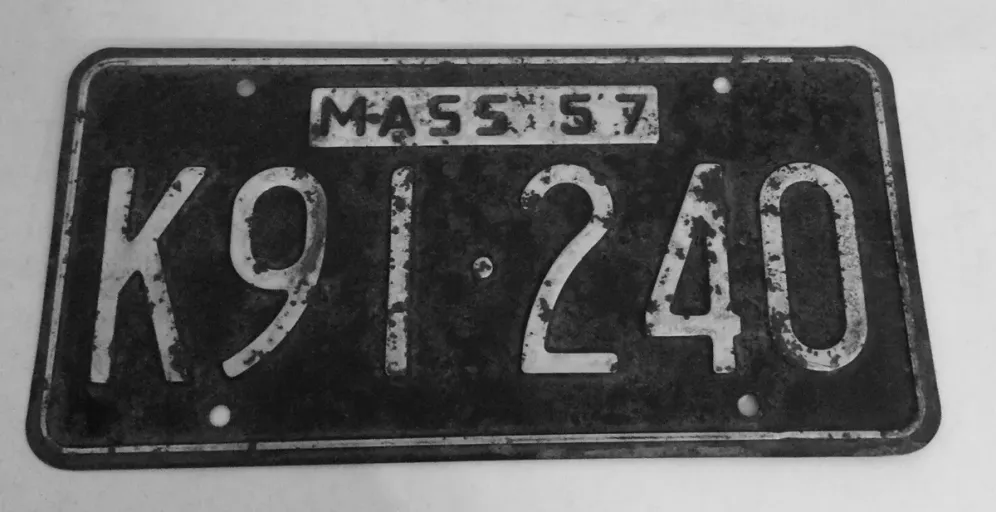

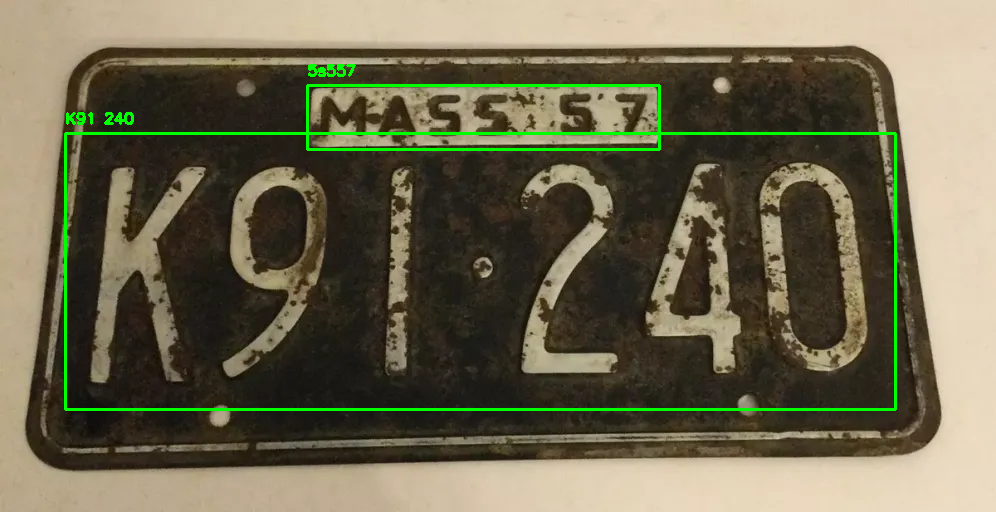

In [ ]:
# Carregar a imagem
img = cv2.imread('/content/drive/MyDrive/ImagensTrabalhoPlaca/Carros/carro18.webp')
# Converter para escala de cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)
# Detectar e ler texto usando EasyOCR
reader = easyocr.Reader(['en'])
result = reader.readtext(gray)

# Desenhar retângulos ao redor das áreas de texto detectadas
for detection in result:
    top_left = tuple(map(int, detection[0][0]))
    bottom_right = tuple(map(int, detection[0][2]))
    text = detection[1]
    cv2.rectangle(img, top_left, bottom_right, (0, 255, 0), 2)
    cv2.putText(img, text, (top_left[0], top_left[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Mostrar o resultado
cv2_imshow(img)

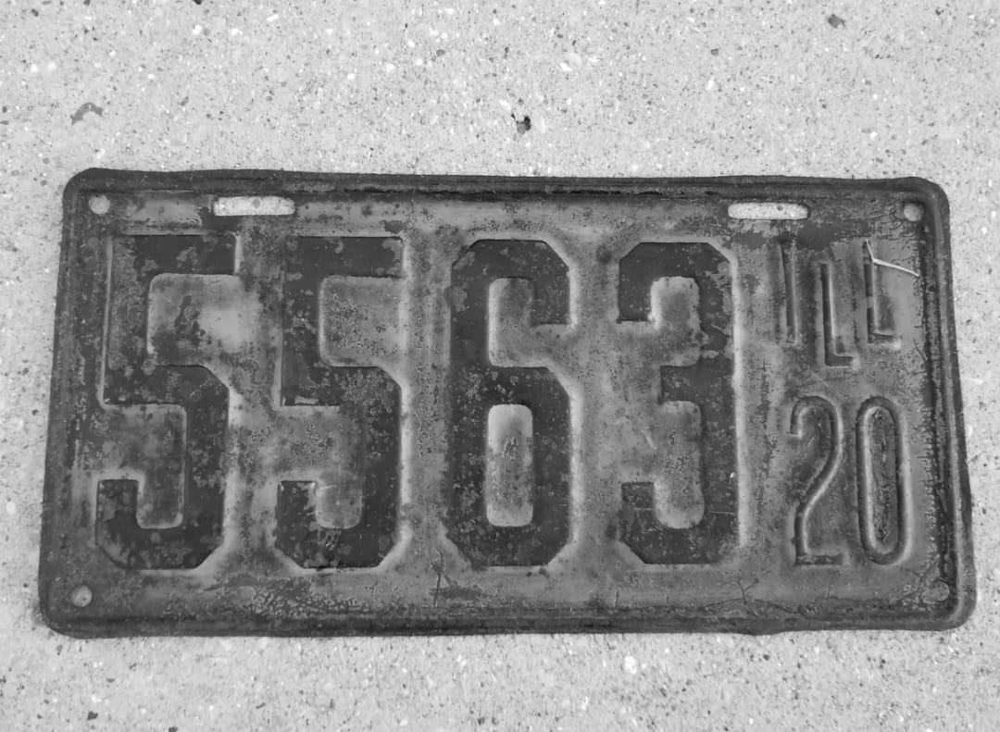

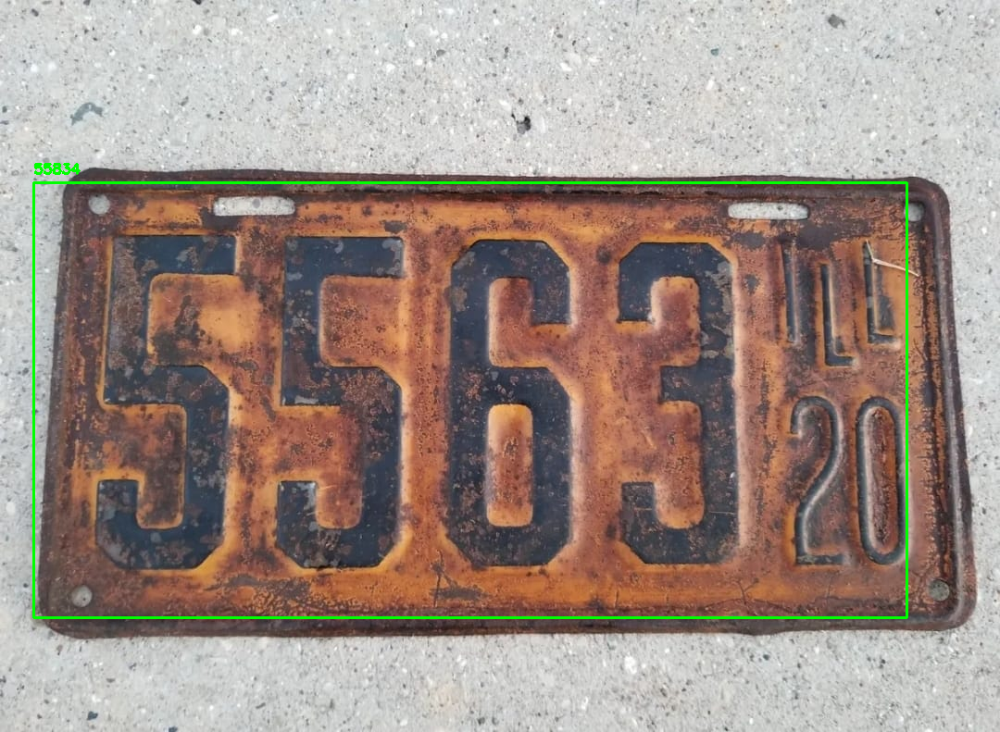

In [ ]:
# Carregar a imagem
img = cv2.imread('/content/drive/MyDrive/ImagensTrabalhoPlaca/Carros/carro12.jpeg')
# Converter para escala de cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)
# Detectar e ler texto usando EasyOCR
reader = easyocr.Reader(['en'])
result = reader.readtext(gray)

# Desenhar retângulos ao redor das áreas de texto detectadas
for detection in result:
    top_left = tuple(map(int, detection[0][0]))
    bottom_right = tuple(map(int, detection[0][2]))
    text = detection[1]
    cv2.rectangle(img, top_left, bottom_right, (0, 255, 0), 2)
    cv2.putText(img, text, (top_left[0], top_left[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Mostrar o resultado
cv2_imshow(img)

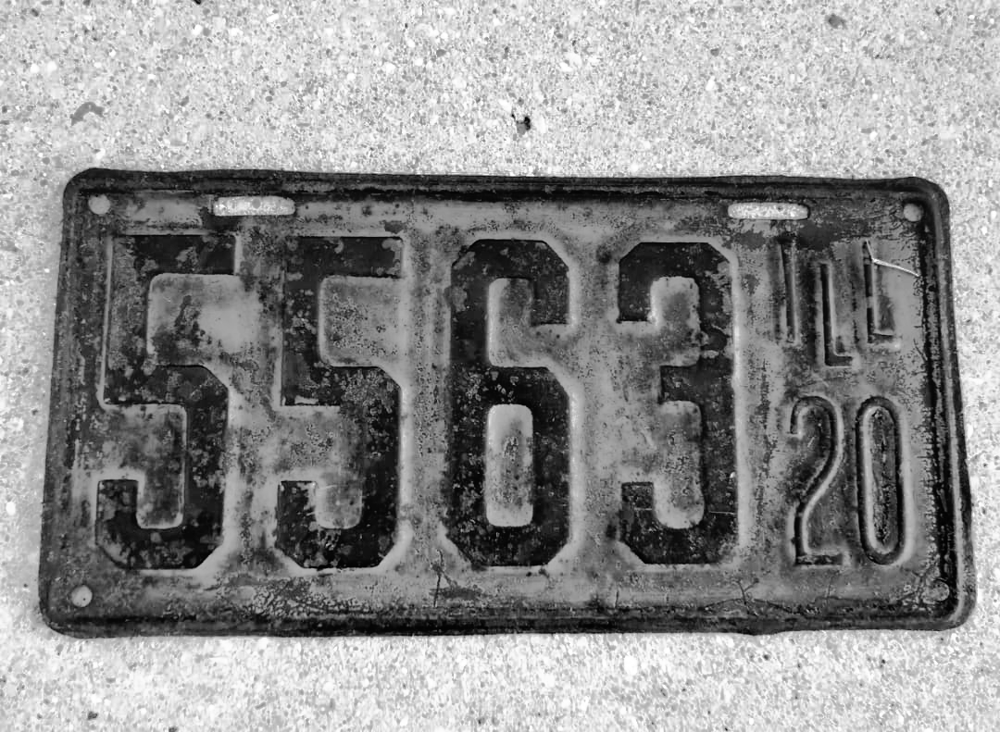

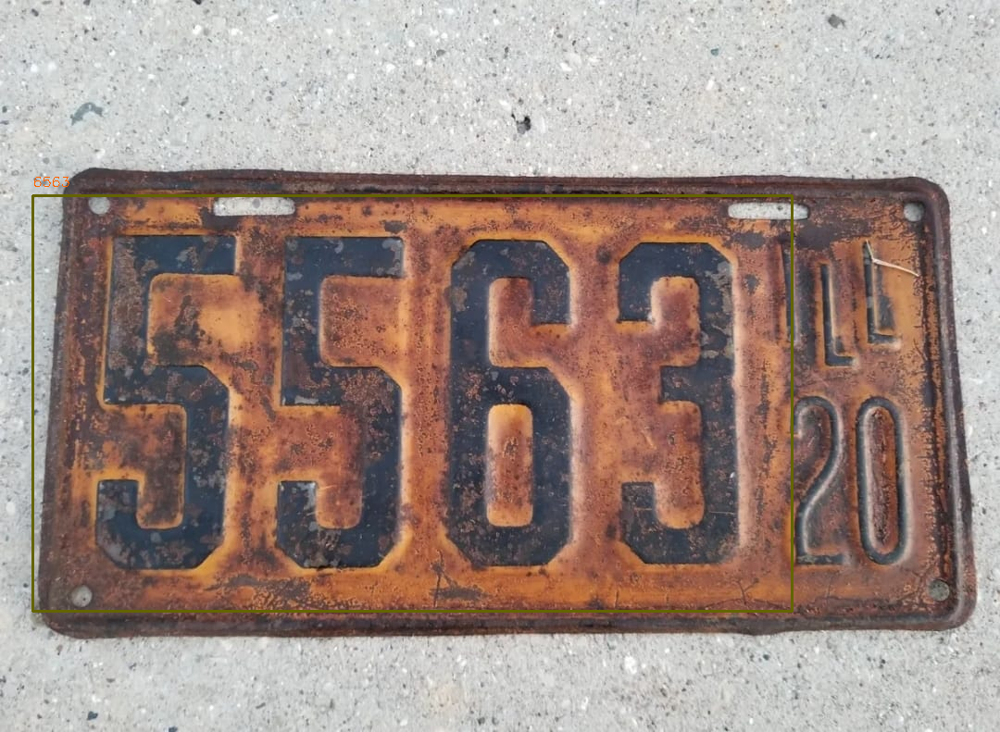

In [ ]:
##### O QUE DEU CERTOOO

img = cv2.imread('/content/drive/MyDrive/ImagensTrabalhoPlaca/Carros/carro12.jpeg')

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Equalização
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(2,2))
gray_eq = clahe.apply(gray)

cv2_imshow(gray_eq)

# Detectar e ler texto usando EasyOCR
reader = easyocr.Reader(['en'])
result = reader.readtext(gray_eq)

for detection in result:
    # Obter coordenadas e texto da detecção
    top_left = tuple(map(int, detection[0][0]))
    bottom_right = tuple(map(int, detection[0][2]))
    text = detection[1]

    # Desenhar retângulo e texto na imagem original
    cv2.rectangle(img, top_left, bottom_right, (0, 100, 100), 2)
    cv2.putText(img, text, (top_left[0], top_left[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 100, 255), 1)

cv2_imshow(img)

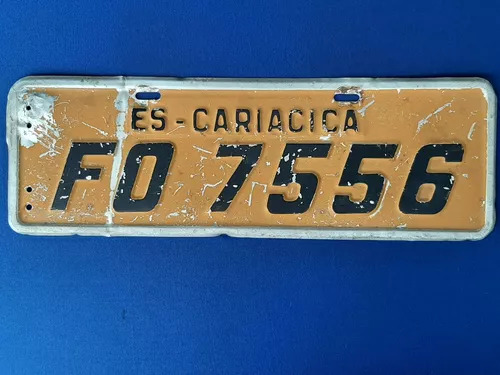

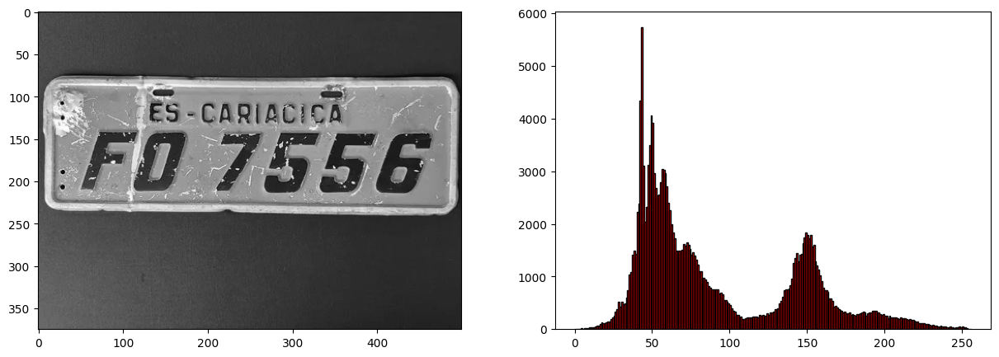

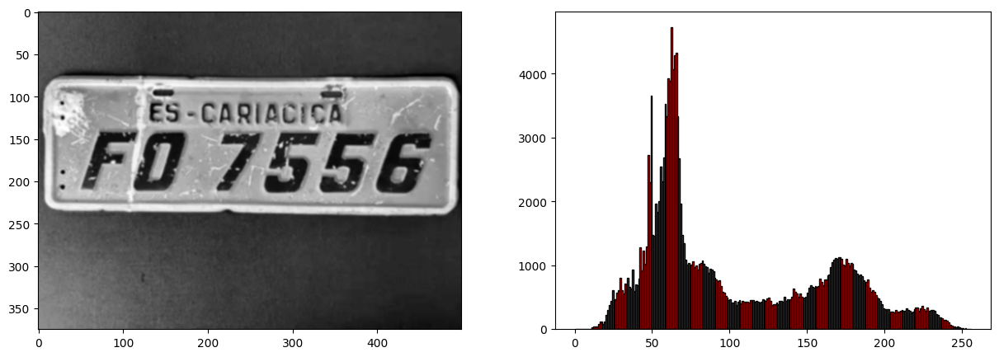

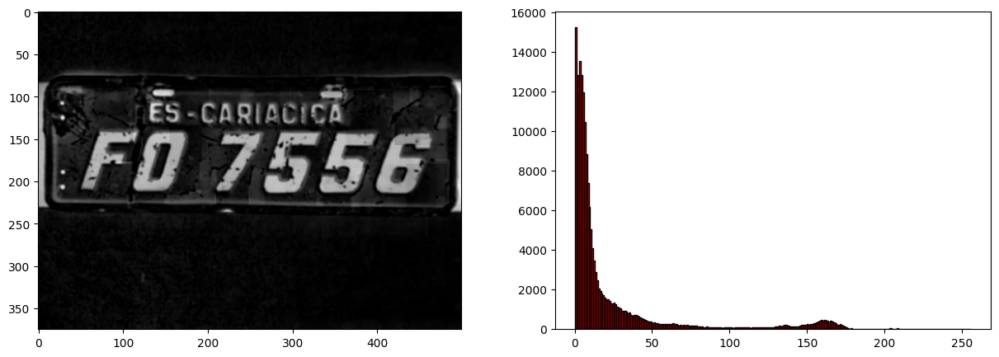

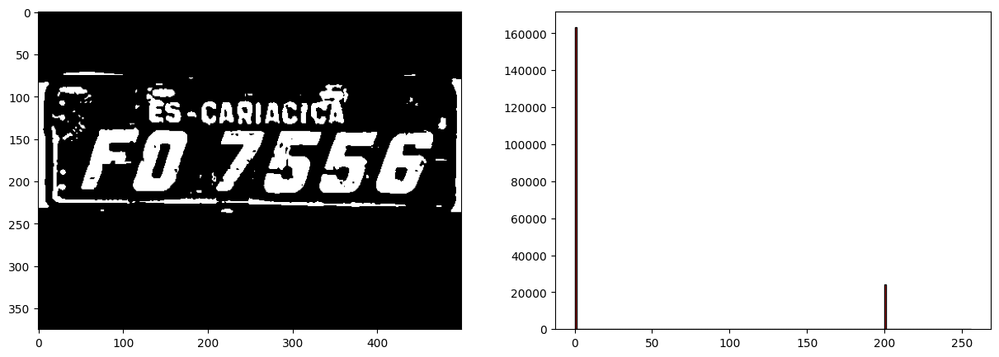

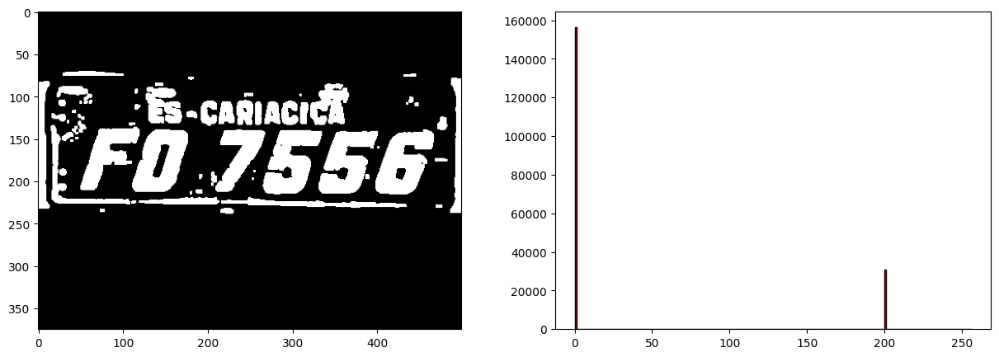

In [ ]:
####### O QUE DEU CERTO COM EROSÃO E DILATAÇÃO

# Carregar a imagem
img = cv2.imread('/content/drive/MyDrive/ImagensTrabalhoPlaca/Carros/carro14.jpeg')
# Converter para escala de cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(img)

#equalização
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(2,2))
gray_eq = clahe.apply(gray)

# Blur
blur = cv2.GaussianBlur(src=gray_eq,ksize=(5,5),sigmaX=0)
#cv2_imshow(blur)

#imagem com filtro black hat
img_car_blackhat = cv2.morphologyEx(blur, cv2.MORPH_BLACKHAT, np.ones((29,29),np.uint8))
#cv2_imshow(img_car_blackhat)

#limiarização - armazena em only_chars
threshold, only_chars = cv2.threshold(img_car_blackhat, 50, 200, cv2.THRESH_BINARY)
#cv2_imshow(only_chars)


#mesma imagem com erosão
kernel = np.ones((1,1),np.uint8)
erosion =  cv2.erode(only_chars, kernel, iterations=1)

#imagem anterior com dilatação aplicada
kernel1 = np.ones((3,3),np.uint8)
dilation =  cv2.dilate(erosion, kernel1, iterations=1)
#cv2_imshow(dilation)

# gray
f,(ax1,ax2) = plt.subplots(1, 2, figsize=(15,5))
ax1.imshow(gray, cmap='gray')
ax2.hist(gray.ravel(), bins = 256, range = [0,256], color='red', edgecolor='black');

# blur
g,(ax3,ax4) = plt.subplots(1, 2, figsize=(15,5))
ax3.imshow(blur, cmap='gray')
ax4.hist(blur.ravel(), bins = 256, range = [0,256], color='red', edgecolor='black');

# black hat 1
h,(ax5,ax6) = plt.subplots(1, 2, figsize=(15,5))
ax5.imshow(img_car_blackhat, cmap='gray')
ax6.hist(img_car_blackhat.ravel(), bins = 256, range = [0,256], color='red', edgecolor='black');

# black hat 2
i,(ax7,ax8) = plt.subplots(1, 2, figsize=(15,5))
ax7.imshow(only_chars, cmap='gray')
ax8.hist(only_chars.ravel(), bins = 256, range = [0,256], color='red', edgecolor='black');

# dilatação e erosão
o,(ax9,ax10) = plt.subplots(1, 2, figsize=(15,5))
ax9.imshow(dilation, cmap='gray')
ax10.hist(dilation.ravel(), bins = 256, range = [0,256], color='red', edgecolor='black');

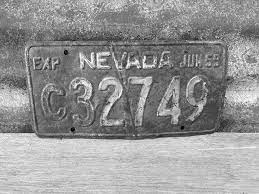

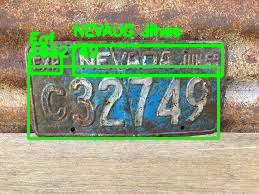

In [ ]:
# Carregar a imagem
img = cv2.imread('/content/drive/MyDrive/ImagensTrabalhoPlaca/Carros/carro10.png')
# Converter para escala de cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)
# Detectar e ler texto usando EasyOCR
reader = easyocr.Reader(['en'])
result = reader.readtext(gray)

# Desenhar retângulos ao redor das áreas de texto detectadas
for detection in result:
    top_left = tuple(map(int, detection[0][0]))
    bottom_right = tuple(map(int, detection[0][2]))
    text = detection[1]
    cv2.rectangle(img, top_left, bottom_right, (0, 255, 0), 2)
    cv2.putText(img, text, (top_left[0], top_left[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Mostrar o resultado
cv2_imshow(img)


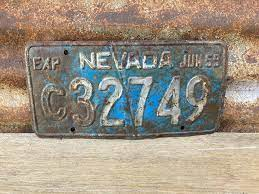

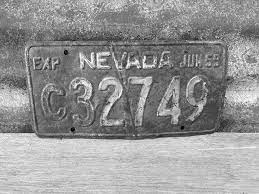

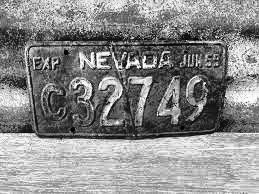

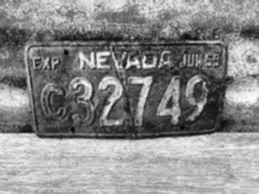

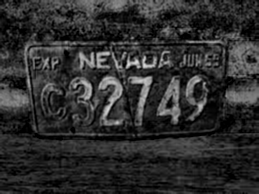

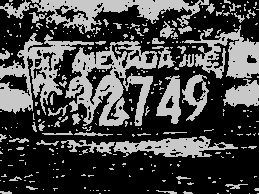

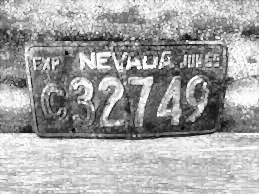

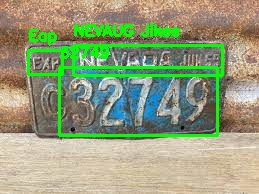

In [ ]:
# Carregar a imagem
img = cv2.imread('/content/drive/MyDrive/ImagensTrabalhoPlaca/Carros/carro10.png')
cv2_imshow(img)
# Converter para escala de cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

# Equalização
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(2,2))
gray_eq = clahe.apply(gray)
cv2_imshow(gray_eq)

# Blur
blur = cv2.GaussianBlur(src=gray_eq,ksize=(3,3),sigmaX=0)
cv2_imshow(blur)

# código de inverter cores da imagem
inverte = cv2.bitwise_not(blur)

#imagem com filtro black hat
img_car_blackhat = cv2.morphologyEx(inverte, cv2.MORPH_BLACKHAT, np.ones((29,29),np.uint8))
cv2_imshow(img_car_blackhat)

#limiarização - armazena em only_chars
threshold, only_chars = cv2.threshold(img_car_blackhat, 50, 200, cv2.THRESH_BINARY)
cv2_imshow(only_chars)

#mesma imagem com erosão
kernel = np.ones((1,1),np.uint8)
erosion =  cv2.erode(gray_eq, kernel, iterations=1)

#imagem anterior com dilatação aplicada
kernel1 = np.ones((2,2),np.uint8)
dilation =  cv2.dilate(erosion, kernel1, iterations=1)
cv2_imshow(dilation)


# Detectar e ler texto usando EasyOCR
reader = easyocr.Reader(['en'])
result = reader.readtext(erosion)

# Desenhar retângulos ao redor das áreas de texto detectadas
for detection in result:
    top_left = tuple(map(int, detection[0][0]))
    bottom_right = tuple(map(int, detection[0][2]))
    text = detection[1]
    cv2.rectangle(img, top_left, bottom_right, (0, 255, 0), 2)
    cv2.putText(img, text, (top_left[0], top_left[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)


cv2_imshow(img)


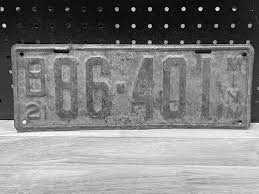

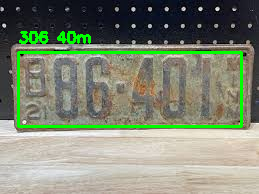

In [ ]:
# Carregar a imagem
img = cv2.imread('/content/drive/MyDrive/ImagensTrabalhoPlaca/Carros/carro11.png')
# Converter para escala de cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)
# Detectar e ler texto usando EasyOCR
reader = easyocr.Reader(['en'])
result = reader.readtext(gray)

# Desenhar retângulos ao redor das áreas de texto detectadas
for detection in result:
    top_left = tuple(map(int, detection[0][0]))
    bottom_right = tuple(map(int, detection[0][2]))
    text = detection[1]
    cv2.rectangle(img, top_left, bottom_right, (0, 255, 0), 2)
    cv2.putText(img, text, (top_left[0], top_left[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Mostrar o resultado
cv2_imshow(img)


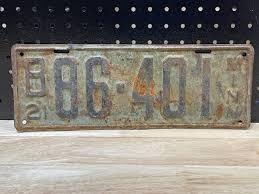

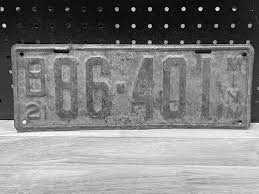

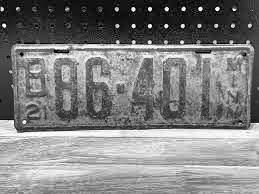

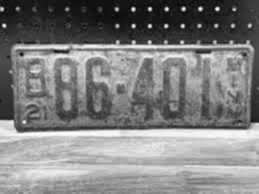

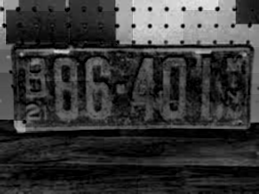

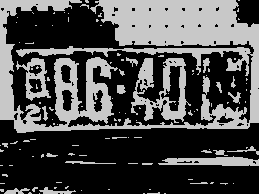

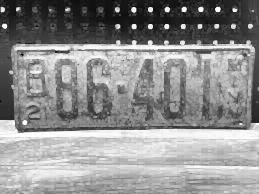

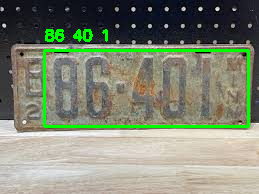

In [ ]:
# Carregar a imagem
img = cv2.imread('/content/drive/MyDrive/ImagensTrabalhoPlaca/Carros/carro11.png')
# Converter para escala de cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(img)
cv2_imshow(gray)

# Equalização
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(2,2))
gray_eq = clahe.apply(gray)
cv2_imshow(gray_eq)

#inverte = cv2.bitwise_not(gray)

# Blur
blur = cv2.GaussianBlur(src=gray_eq,ksize=(3,3),sigmaX=0)
cv2_imshow(blur)

#imagem com filtro black hat
img_car_blackhat = cv2.morphologyEx(blur, cv2.MORPH_BLACKHAT, np.ones((29,29),np.uint8))
cv2_imshow(img_car_blackhat)

#limiarização - armazena em only_chars
threshold, only_chars = cv2.threshold(img_car_blackhat, 50, 200, cv2.THRESH_BINARY)
cv2_imshow(only_chars)

#mesma imagem com erosão
kernel = np.ones((1,1),np.uint8)
erosion =  cv2.erode(gray_eq, kernel, iterations=1)

#imagem anterior com dilatação aplicada
kernel1 = np.ones((2,2),np.uint8)
dilation =  cv2.dilate(erosion, kernel1, iterations=1)
cv2_imshow(dilation)

# Detectar e ler texto usando EasyOCR
reader = easyocr.Reader(['en'])
result = reader.readtext(dilation)

# Desenhar retângulos ao redor das áreas de texto detectadas
for detection in result:
    top_left = tuple(map(int, detection[0][0]))
    bottom_right = tuple(map(int, detection[0][2]))
    text = detection[1]
    cv2.rectangle(img, top_left, bottom_right, (0, 255, 0), 2)
    cv2.putText(img, text, (top_left[0], top_left[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Mostrar o resultado
cv2_imshow(img)


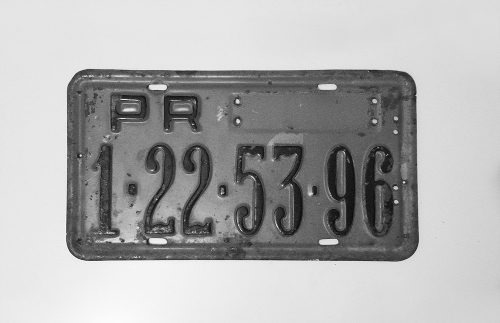

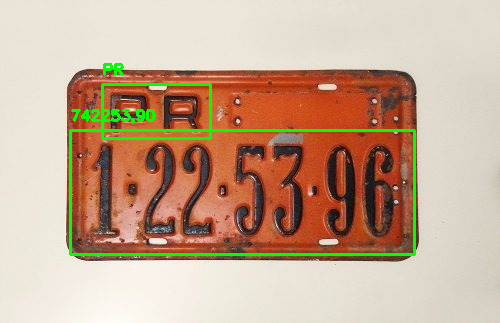

In [ ]:
# Carregar a imagem
img = cv2.imread('/content/drive/MyDrive/ImagensTrabalhoPlaca/Carros/carro16.jpeg')
# Converter para escala de cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)
# Detectar e ler texto usando EasyOCR
reader = easyocr.Reader(['en'])
result = reader.readtext(gray)

# Desenhar retângulos ao redor das áreas de texto detectadas
for detection in result:
    top_left = tuple(map(int, detection[0][0]))
    bottom_right = tuple(map(int, detection[0][2]))
    text = detection[1]
    cv2.rectangle(img, top_left, bottom_right, (0, 255, 0), 2)
    cv2.putText(img, text, (top_left[0], top_left[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Mostrar o resultado
cv2_imshow(img)

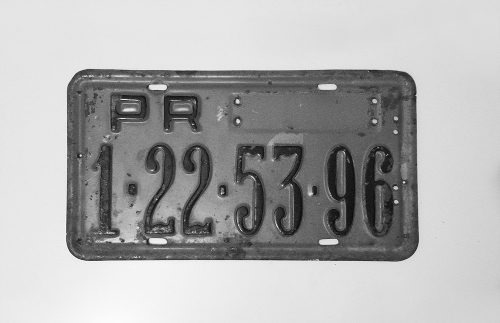

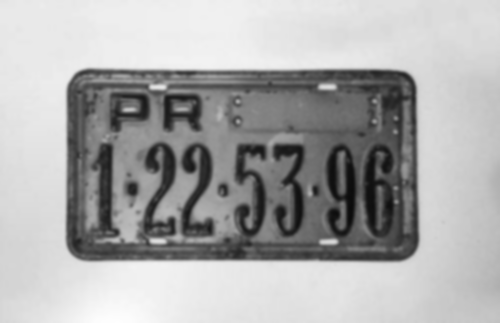

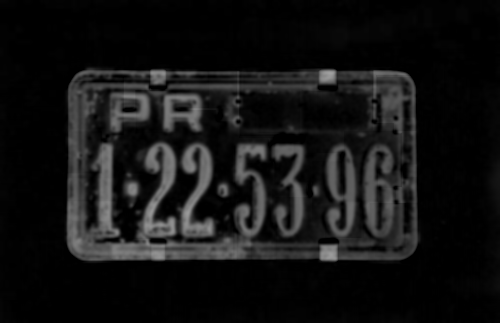

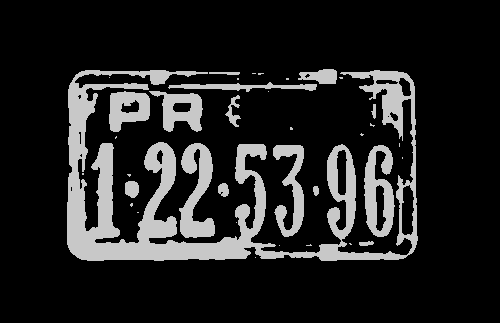

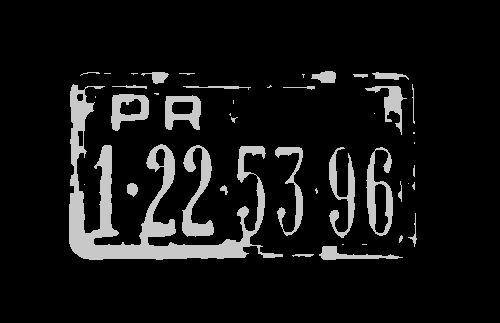

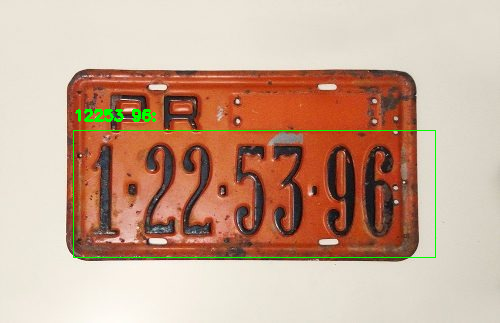

In [ ]:
# Carregar a imagem
img = cv2.imread('/content/drive/MyDrive/ImagensTrabalhoPlaca/Carros/carro16.jpeg')
# Converter para escala de cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

#equalização
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(2,2))
gray_eq = clahe.apply(gray)

# Blur
blur = cv2.GaussianBlur(src=gray_eq,ksize=(7,7),sigmaX=0)
cv2_imshow(blur)

#imagem com filtro black hat
img_car_blackhat = cv2.morphologyEx(blur, cv2.MORPH_BLACKHAT, np.ones((35,35),np.uint8))
cv2_imshow(img_car_blackhat)

#limiarização - armazena em only_chars
threshold, only_chars = cv2.threshold(img_car_blackhat, 50, 200, cv2.THRESH_BINARY)
cv2_imshow(only_chars)

#mesma imagem com erosão
kernel = np.ones((4,4),np.uint8)
erosion =  cv2.erode(only_chars, kernel, iterations=1)

#imagem anterior com dilatação aplicada
kernel1 = np.ones((1,1),np.uint8)
dilation =  cv2.dilate(erosion, kernel1, iterations=1)
cv2_imshow(dilation)

# Detectar e ler texto usando EasyOCR
reader = easyocr.Reader(['en'])
result = reader.readtext(dilation)

# Desenhar retângulos ao redor das áreas de texto detectadas
for detection in result:
    top_left = tuple(map(int, detection[0][0]))
    bottom_right = tuple(map(int, detection[0][2]))
    text = detection[1]
    cv2.rectangle(img, top_left, bottom_right, (0, 255, 0), 1)
    cv2.putText(img, text, (top_left[0], top_left[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Mostrar o resultado
cv2_imshow(img)


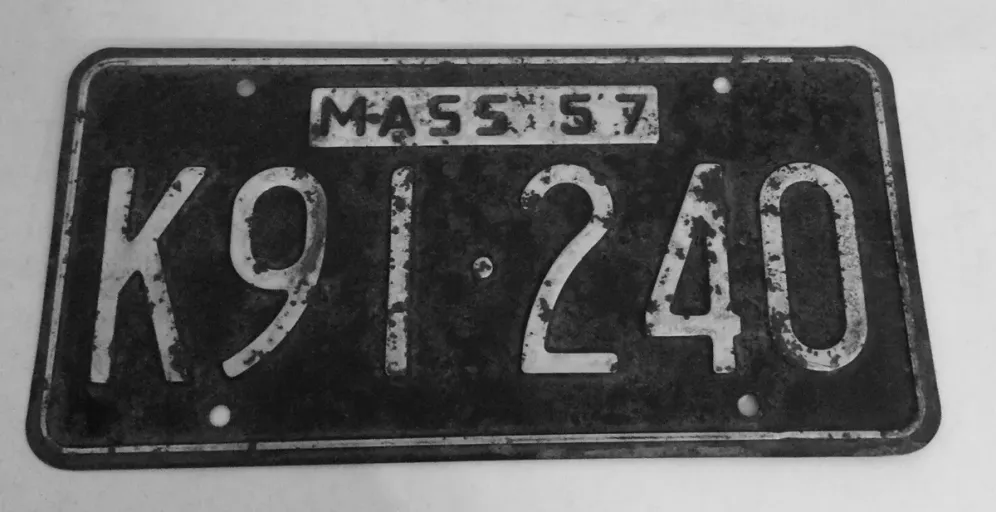

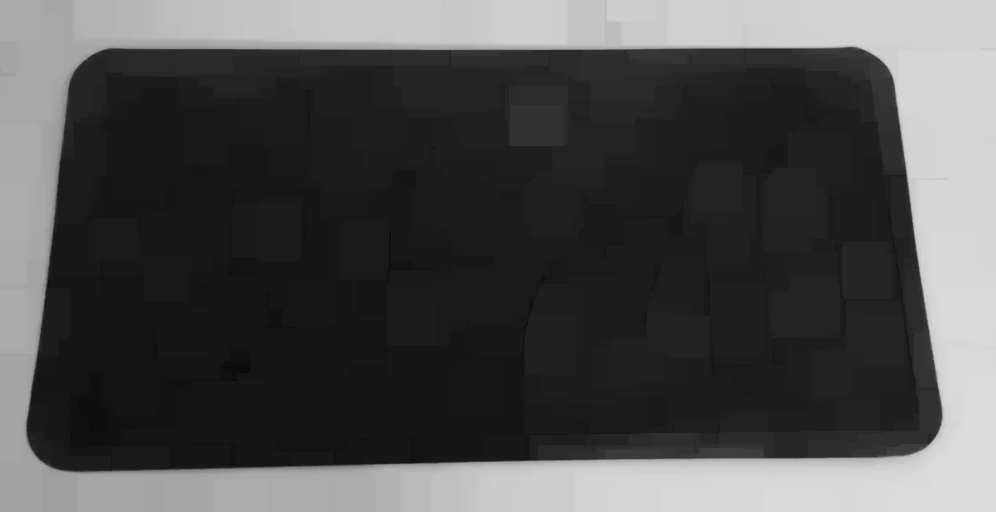

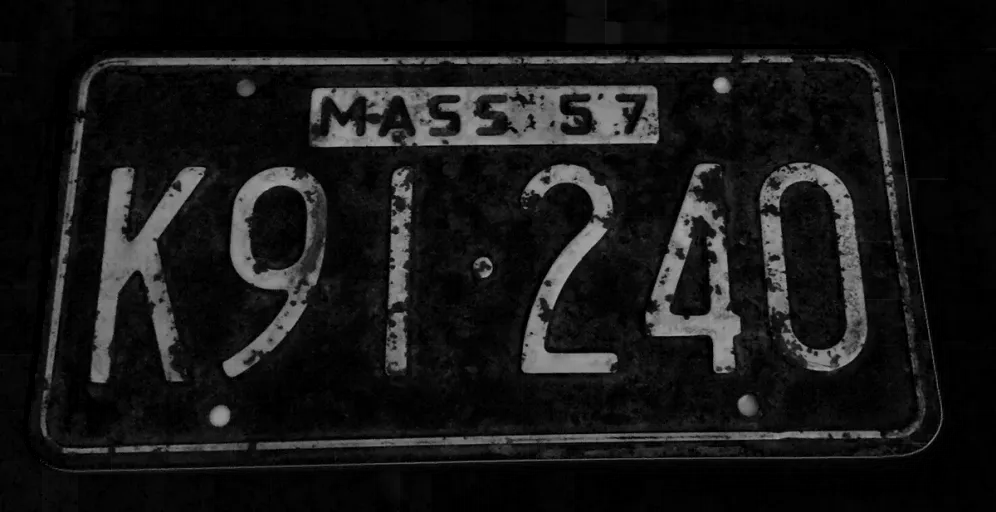

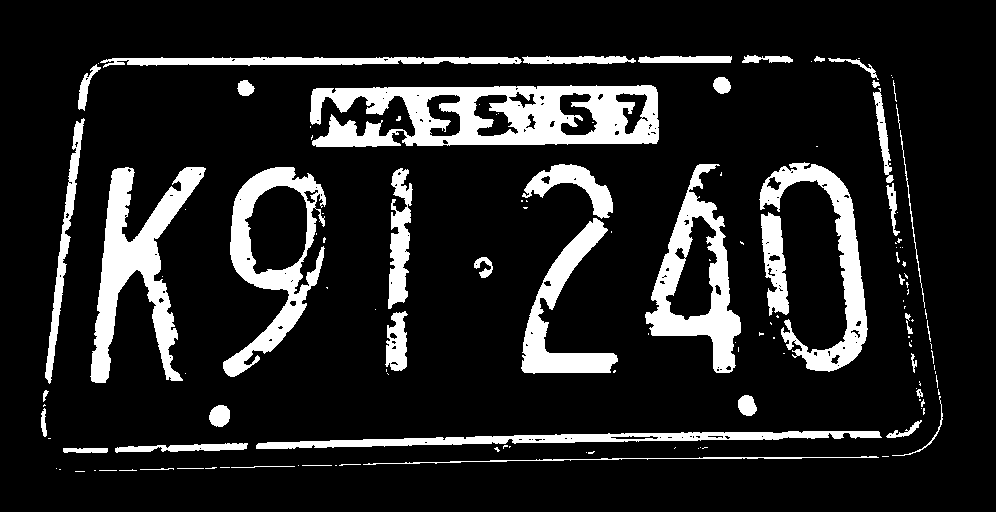

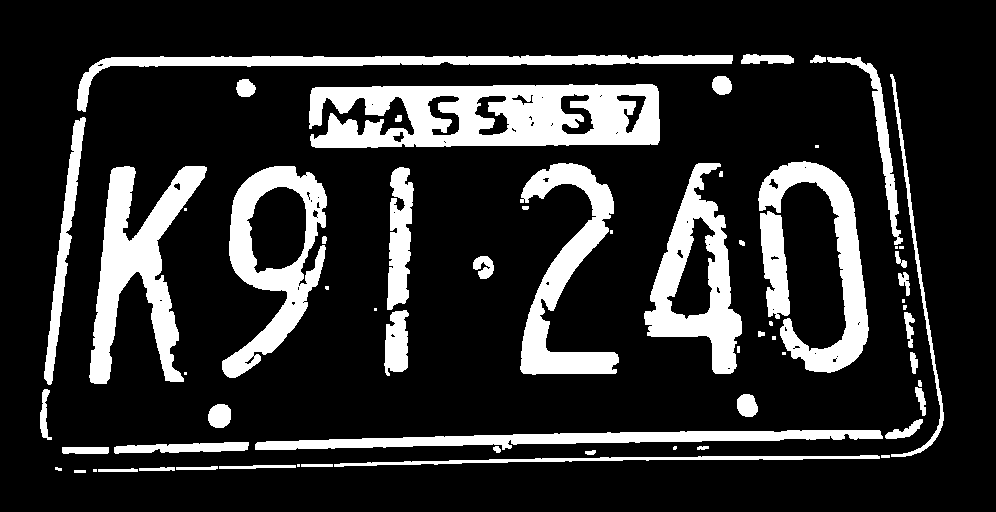

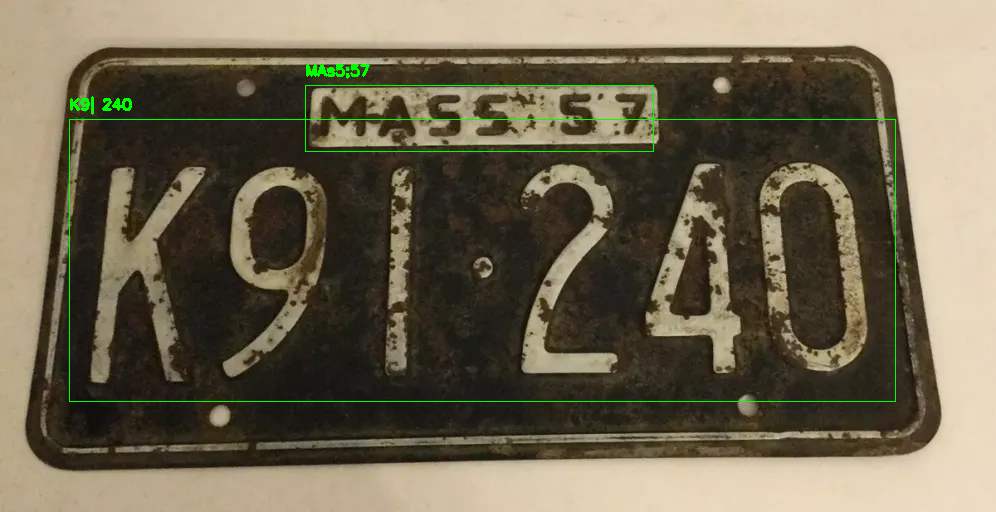

In [ ]:
#Carregar a imagem
img = cv2.imread('/content/drive/MyDrive/ImagensTrabalhoPlaca/Carros/carro18.webp')

#Converter para escala de cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

#mesma imagem com filtro de abertura
kernel = np.ones((40,40),np.uint8)
img_opening = cv2.morphologyEx(gray, cv2.MORPH_OPEN, kernel)
cv2_imshow(img_opening)

#imagem com filtro top hat
img_tophat = cv2.morphologyEx(gray, cv2.MORPH_TOPHAT, kernel)
cv2_imshow(img_tophat)

#limiarização - armazena em only_chars
threshold, only_plate = cv2.threshold(img_tophat, 50, 255, cv2.THRESH_BINARY)
cv2_imshow(only_plate)

#mesma imagem com erosão
kernel = np.ones((1,1),np.uint8)
erosion =  cv2.erode(only_plate, kernel, iterations=1)

#imagem anterior com dilatação aplicada
kernel1 = np.ones((3,3),np.uint8)
dilation =  cv2.dilate(erosion, kernel1, iterations=1)
cv2_imshow(dilation)

# Detectar e ler texto usando EasyOCR
reader = easyocr.Reader(['en'])
result = reader.readtext(only_plate)

#Desenhar retângulos ao redor das áreas de texto detectadas
for detection in result:
    top_left = tuple(map(int, detection[0][0]))
    bottom_right = tuple(map(int, detection[0][2]))
    text = detection[1]
    cv2.rectangle(img, top_left, bottom_right, (0, 255, 0), 1)
    cv2.putText(img, text, (top_left[0], top_left[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

cv2_imshow(img)

#Erros

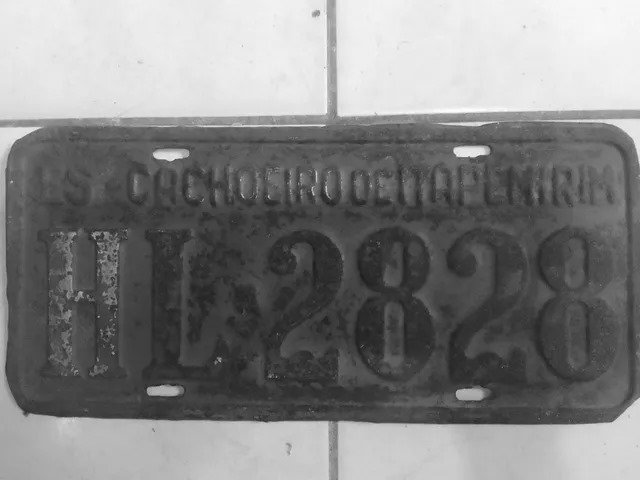

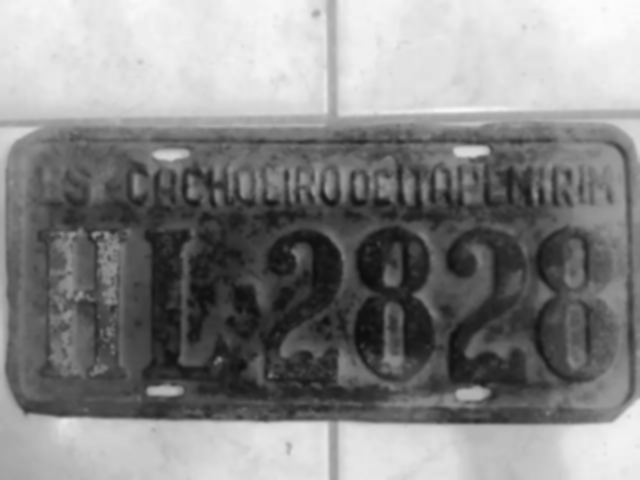

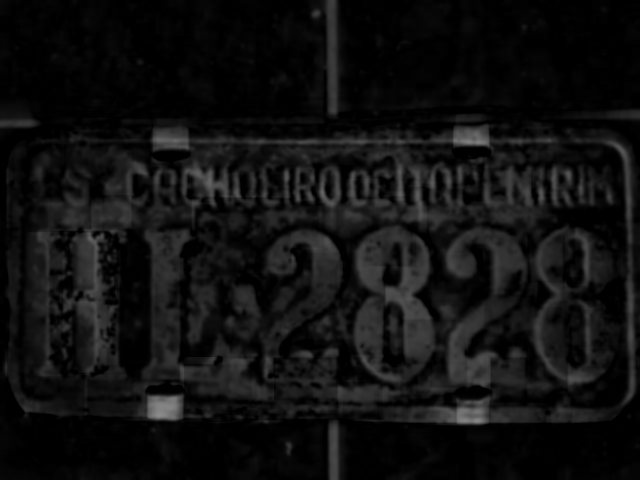

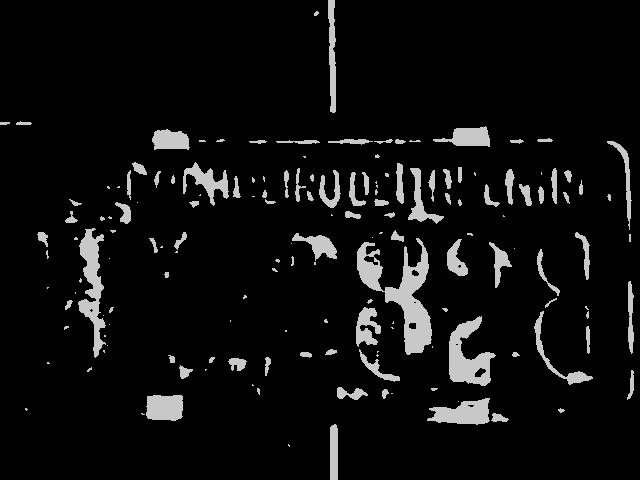

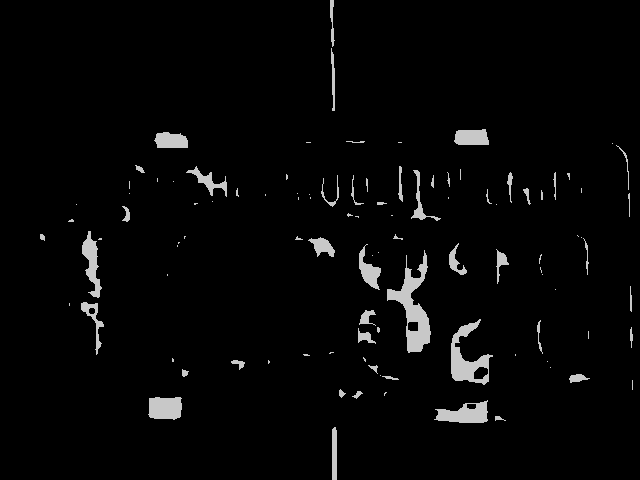

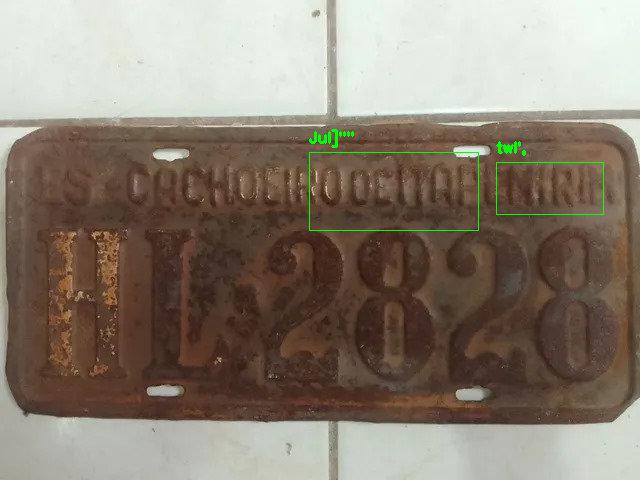

In [ ]:
# Carregar a imagem
img = cv2.imread('/content/drive/MyDrive/ImagensTrabalhoPlaca/Carros/carro20.jpeg')
# Converter para escala de cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

#equalização
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(2,2))
gray_eq = clahe.apply(gray)

# Blur
blur = cv2.GaussianBlur(src=gray_eq,ksize=(7,7),sigmaX=0)
cv2_imshow(blur)

#imagem com filtro black hat
img_car_blackhat = cv2.morphologyEx(blur, cv2.MORPH_BLACKHAT, np.ones((35,35),np.uint8))
cv2_imshow(img_car_blackhat)

#limiarização - armazena em only_chars
threshold, only_chars = cv2.threshold(img_car_blackhat, 50, 200, cv2.THRESH_BINARY)
cv2_imshow(only_chars)

#mesma imagem com erosão
kernel = np.ones((4,4),np.uint8)
erosion =  cv2.erode(only_chars, kernel, iterations=1)

#imagem anterior com dilatação aplicada
kernel1 = np.ones((1,1),np.uint8)
dilation =  cv2.dilate(erosion, kernel1, iterations=1)
cv2_imshow(dilation)

# Detectar e ler texto usando EasyOCR
reader = easyocr.Reader(['en'])
result = reader.readtext(dilation)

# Desenhar retângulos ao redor das áreas de texto detectadas
for detection in result:
    top_left = tuple(map(int, detection[0][0]))
    bottom_right = tuple(map(int, detection[0][2]))
    text = detection[1]
    cv2.rectangle(img, top_left, bottom_right, (0, 255, 0), 1)
    cv2.putText(img, text, (top_left[0], top_left[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Mostrar o resultado
cv2_imshow(img)

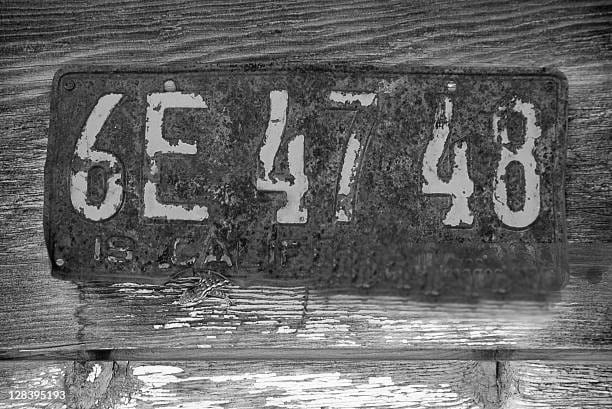

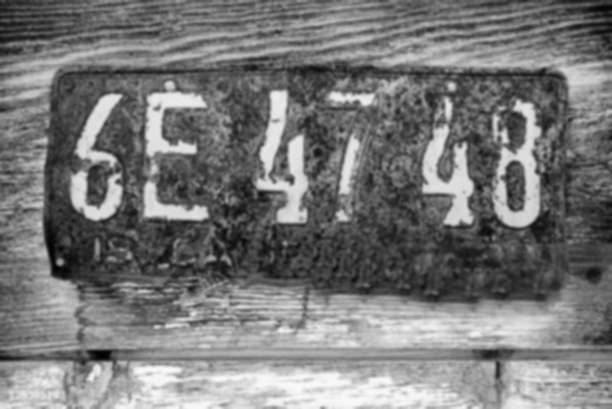

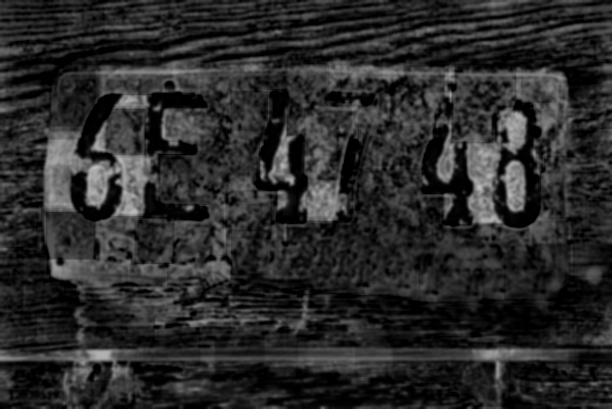

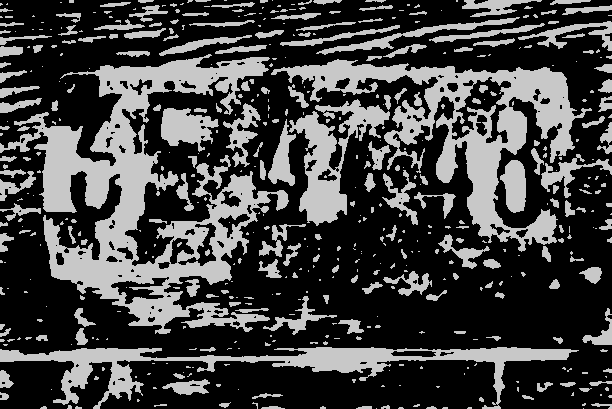

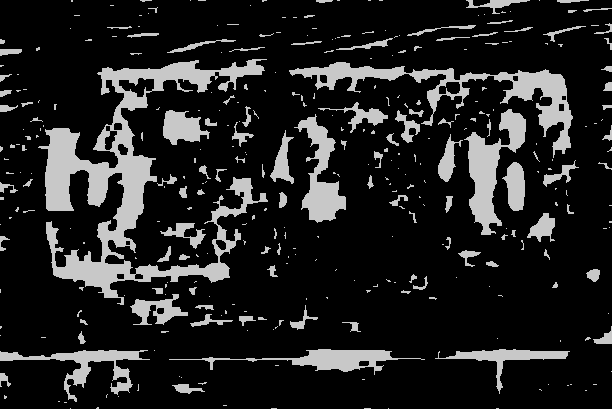

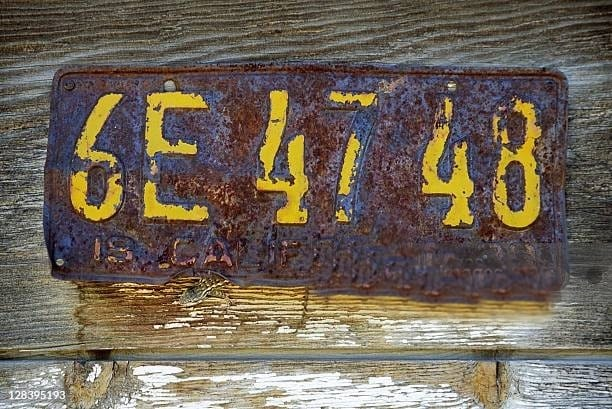

In [ ]:
# Carregar a imagem
img = cv2.imread('/content/drive/MyDrive/ImagensTrabalhoPlaca/Carros/carro21.jpeg')
# Converter para escala de cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

#equalização
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(2,2))
gray_eq = clahe.apply(gray)

# Blur
blur = cv2.GaussianBlur(src=gray_eq,ksize=(7,7),sigmaX=0)
cv2_imshow(blur)

#imagem com filtro black hat
img_car_blackhat = cv2.morphologyEx(blur, cv2.MORPH_BLACKHAT, np.ones((35,35),np.uint8))
cv2_imshow(img_car_blackhat)

#limiarização - armazena em only_chars
threshold, only_chars = cv2.threshold(img_car_blackhat, 50, 200, cv2.THRESH_BINARY)
cv2_imshow(only_chars)

#mesma imagem com erosão
kernel = np.ones((4,4),np.uint8)
erosion =  cv2.erode(only_chars, kernel, iterations=1)

#imagem anterior com dilatação aplicada
kernel1 = np.ones((1,1),np.uint8)
dilation =  cv2.dilate(erosion, kernel1, iterations=1)
cv2_imshow(dilation)

# Detectar e ler texto usando EasyOCR
reader = easyocr.Reader(['en'])
result = reader.readtext(dilation)

# Desenhar retângulos ao redor das áreas de texto detectadas
for detection in result:
    top_left = tuple(map(int, detection[0][0]))
    bottom_right = tuple(map(int, detection[0][2]))
    text = detection[1]
    cv2.rectangle(img, top_left, bottom_right, (0, 255, 0), 1)
    cv2.putText(img, text, (top_left[0], top_left[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Mostrar o resultado
cv2_imshow(img)

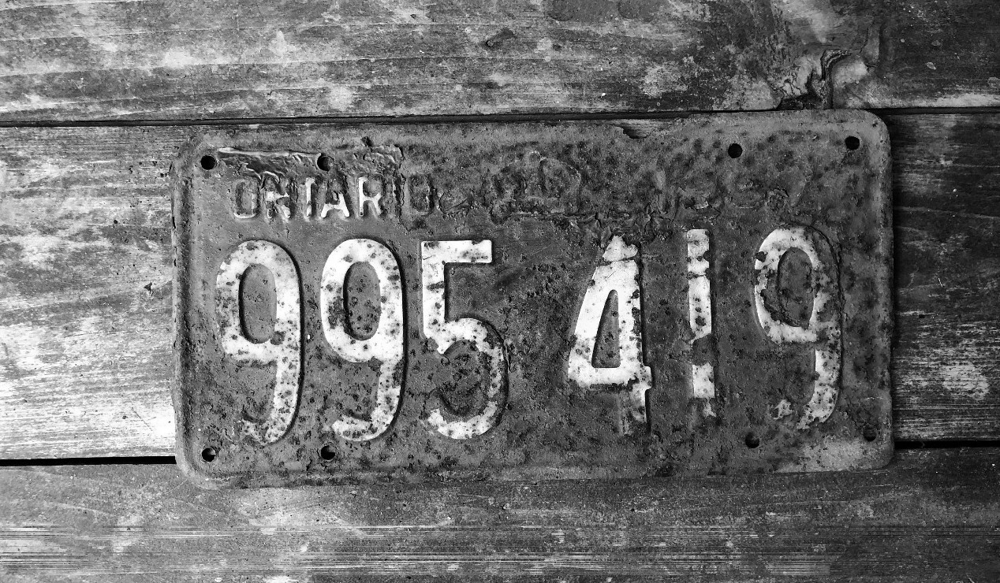

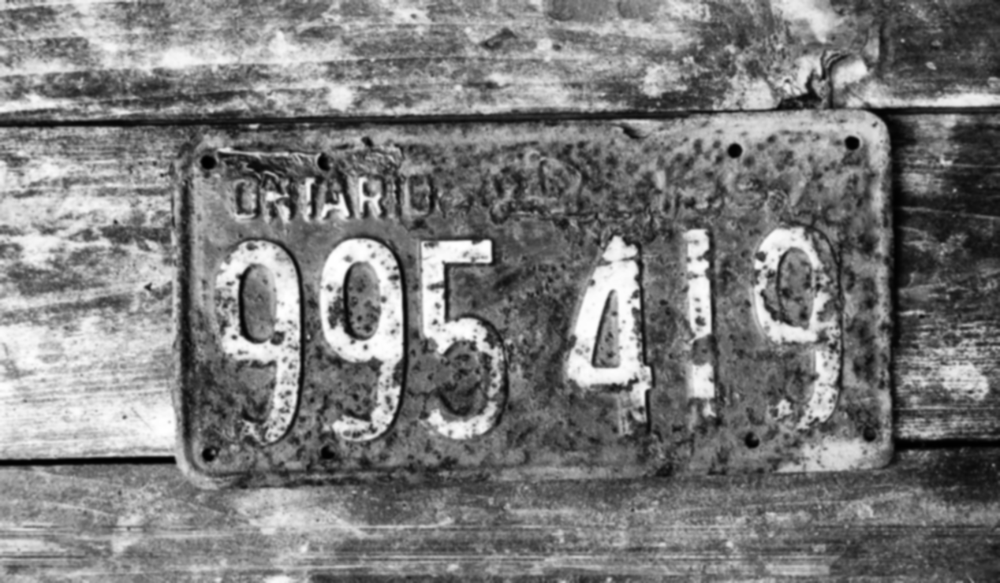

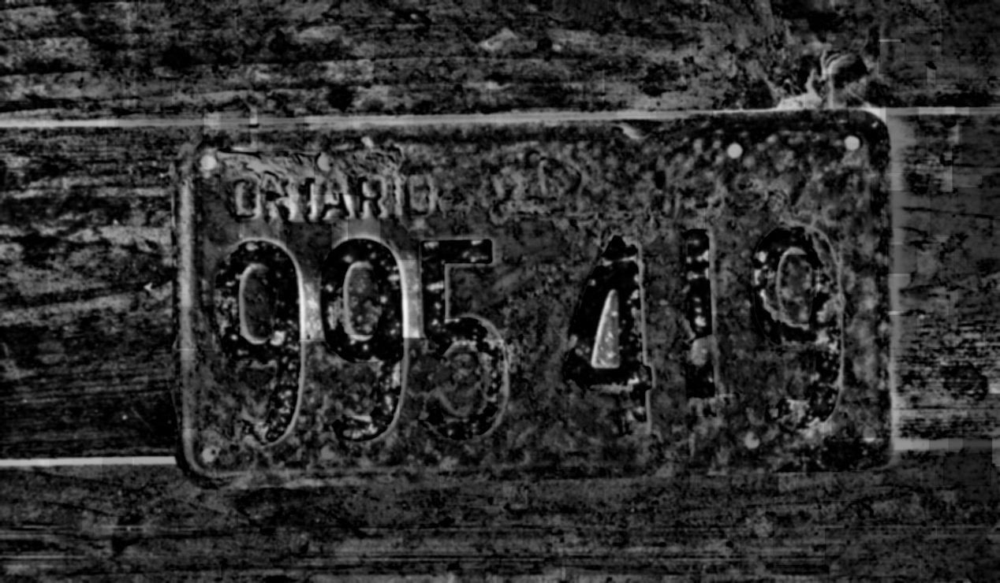

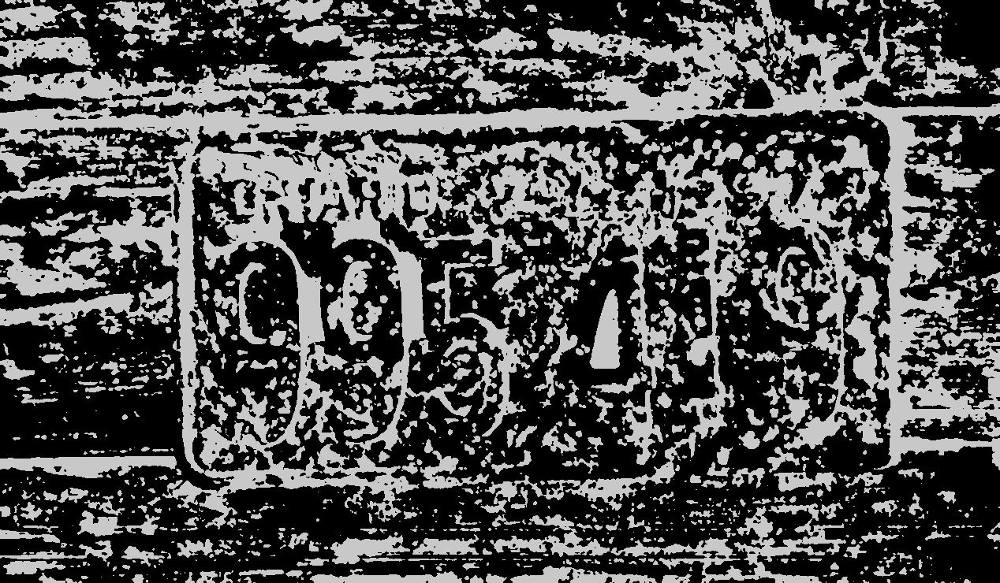

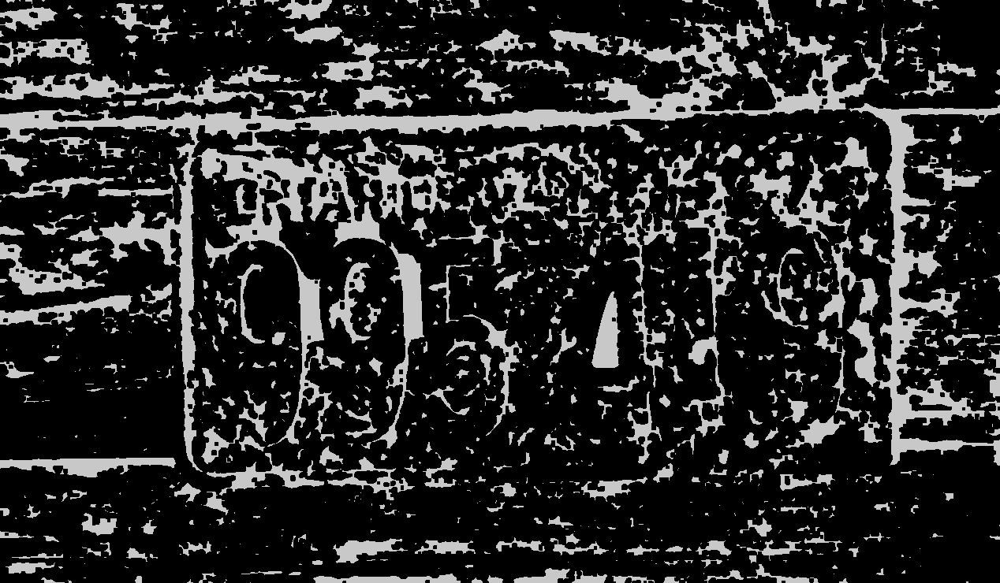

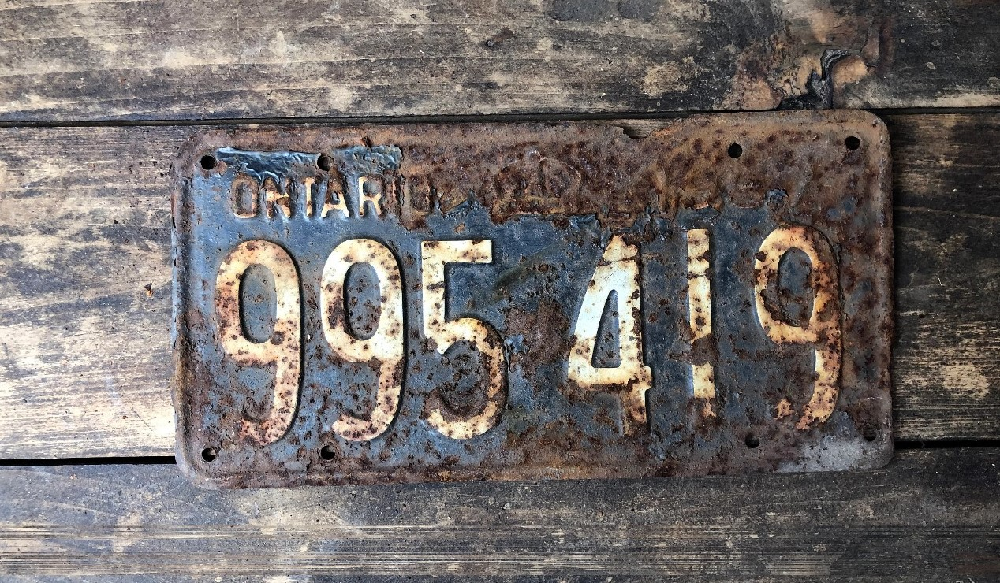

In [ ]:
# Carregar a imagem
img = cv2.imread('/content/drive/MyDrive/ImagensTrabalhoPlaca/Carros/carro22.jpeg')
# Converter para escala de cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

#equalização
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(2,2))
gray_eq = clahe.apply(gray)

# Blur
blur = cv2.GaussianBlur(src=gray_eq,ksize=(7,7),sigmaX=0)
cv2_imshow(blur)

#imagem com filtro black hat
img_car_blackhat = cv2.morphologyEx(blur, cv2.MORPH_BLACKHAT, np.ones((35,35),np.uint8))
cv2_imshow(img_car_blackhat)

#limiarização - armazena em only_chars
threshold, only_chars = cv2.threshold(img_car_blackhat, 50, 200, cv2.THRESH_BINARY)
cv2_imshow(only_chars)

#mesma imagem com erosão
kernel = np.ones((4,4),np.uint8)
erosion =  cv2.erode(only_chars, kernel, iterations=1)

#imagem anterior com dilatação aplicada
kernel1 = np.ones((1,1),np.uint8)
dilation =  cv2.dilate(erosion, kernel1, iterations=1)
cv2_imshow(dilation)

# Detectar e ler texto usando EasyOCR
reader = easyocr.Reader(['en'])
result = reader.readtext(dilation)

# Desenhar retângulos ao redor das áreas de texto detectadas
for detection in result:
    top_left = tuple(map(int, detection[0][0]))
    bottom_right = tuple(map(int, detection[0][2]))
    text = detection[1]
    cv2.rectangle(img, top_left, bottom_right, (0, 255, 0), 1)
    cv2.putText(img, text, (top_left[0], top_left[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Mostrar o resultado
cv2_imshow(img)

#Conclusão

No âmbito deste projeto, foi possível realizar a detecção dos números e letras em algumas placas de veículos com o método utilizado. Entretanto, enfrentamos desafios em algumas delas, nas quais não foi viável aplicar os filtros devido à falta de contraste adequado entre as cores ou à presença de ferrugem, dificultando a distinção entre o fundo e as letras. Para avanços futuros, planejamos a implementação de novos filtros e aprimoramentos visando a melhoria do reconhecimento em diferentes veículos simultaneamente.

##Dificuldades Encontradas

Durante o processo de desenvolvimento do código para processamento de imagens de placas veiculares, enfrentamos diversos obstáculos. Essas dificuldades incluíram: a criação de um método eficaz para detecção de danos, compreensão e aplicação da filtragem espacial e morfologia matemática, além do ajuste de parâmetros do código. Trabalhar exclusivamente com tons de cinza também foi um desafio, assim como entender o funcionamento do código, também é importante mencionar que encontrar imagens com má qualidade que pudessem ser tratadas não foi uma tarefa fácil, por conta disso, algumas imagens que tinhámos não foram possíveis serem tratadas por falta de contrasteadequado, presença de ferrugem e com a tintura prejudicada.  Apesar disso tudo, adotamos um método diferente que permitu uma melhoria nos danos em placas de veículos.

##Foi possível resolvê-las?
Durante o desenvolvimento do trabalho, pudemos estudar mais os conceitos e compreender de uma maneira mais aprofundada assunto tratado. Sendo assim, com o nosso método, obtivemos bons resultados em algumas imagens, sendo possível trabalhar e tirar bom proveito da filtragem espacial junto com a morfologia matemática.
Em outras imagens, por conta de certos fatores já apresentados anteriormente na conclusão, foi notado que seria


##O que pode ser feito para continuar/aprofundar o trabalho posteriormente?

Para continuar e aprofundar nosso trabalho, será pesquisado métodos para melhorar a qualidade de imagens de baixa resolução. Também planejamos usar estudos avançados em visão computacional para melhorar o código de reconhecimento de placas de veículos, com o uso de inteligência artificial e técnicas avançadas. Isso incluirá a busca por algoritmos melhores e a integração de formas de reconhecimento de placas mais preciso e rápido. Nosso objetivo é garantir que nosso sistema de processamento de imagens seja eficaz e capaz de lidar com os desafios em constante mudança na segurança e monitoramento de tráfego.


## Referências



1.   Slides de Aula - Aula 5 ao 8.

2.    UNIVERSO DISCRETO. MORFOLOGIA MATEMÁTICA (Erosão, Dilatação, Abertura, Fechamento, etc) - Python & OpenCV 4 #13. Youtube. Data de publicação: 23 de jul. de 2022. Disponível em: (https://www.youtube.com/watch?v=vwKXU68jkqA).

3. UDEMY. Visão Computacional: O Guia Completo. Disponível em: (https://www.udemy.com/course/visao-computacional-o-guia-completo/).

4. BIÃO CERQUEIRA, Marcos Vinicius. IMPLEMENTAÇÃO DE SEGMENTAÇÃO DE PLACAS
VEICULARES UTILIZANDO OPENCV, 2016. 59 páginas. Técnologia. UNIVERSIDADE FEDERAL DO RECÔNCAVO DA BAHIA CENTRO DE CIÊNCIAS EXATAS E TECNOLÓGICAS ENGENHARIA DE COMPUTAÇÃO.

5. NICHOLAS RENOTTE.  Python ANPR with OpenCV and EasyOCR in 25 Minutes | Automatic Number Plate Recognition Tutorial. Youtube. Data de publicação:  13 de dez. de 2020. Disponível em: (https://www.youtube.com/watch?v=NApYP_5wlKY&t=1280s).

6. MACHINE LEARNING HUB. License Plate Recognition using OpenCV Python | Full Tutorial . Youtube. Data de publicação:  27 de nov. de 2020. Disponível em: (https://www.youtube.com/watch?v=yMQvcWBx1fE&t=639s).


